In [2]:
from filepath_util import *
import matplotlib.pyplot as plt
import numpy as np
import os
from tqdm import tqdm
import seaborn as sns
from scipy.stats import norm
import pandas as pd

%matplotlib inline

In [3]:
IMAGE_FILEPATHS = [
    'dataset/1000/10uM_biotin_1000x__024.tif',
    'dataset/1000/5uM_biotin_1000x__006.tif',
    'dataset/1000/naive RBCs_1000x__061.tif',
    'dataset/1000/20uM_biotin_1000x__043.tif',
]

In [4]:
def read_manual_labels(image_filepath):
    labels_filepath = os.path.splitext(image_filepath)[0] + '.csv'
    labels = pd.read_csv(labels_filepath, header=0, index_col=0)
    return labels

In [5]:
AMBIGIOUS_CLASS_LABEL = 4
LABEL_COLUMN = 'Counter'

def label_masks(masks, labels: pd.DataFrame):
    label_is_found = set()
    mask_is_found = set()
    label_is_found_in_multiple_masks = set()
    for mask_index, mask in enumerate(masks):
        bbox = mask['bbox']
        segmentation = mask['segmentation']
        mask['ambigious'] = False
        mask['label'] = AMBIGIOUS_CLASS_LABEL
        matching_labels = 0
        x_0 = int(bbox[0])
        x_1 = int(bbox[0] + bbox[2])
        y_0 = int(bbox[1])
        y_1 = int(bbox[1] + bbox[3])
        for label_index, (x, y, label) in enumerate(zip(labels['X'], labels['Y'], labels[LABEL_COLUMN])):
            x = int(x)
            y = int(y)
            if x >= x_0 and x <= x_1 and y >= y_0 and y <= y_1 and segmentation[y - y_0, x - x_0]:
                matching_labels += 1
                if label_index in label_is_found:
                    label_is_found_in_multiple_masks.add(label_index)
                mask['label'] = label
                label_is_found.add(label_index)
                mask_is_found.add(mask_index)
                
        if matching_labels > 1:
            mask['ambigious'] = True
            mask['label'] = AMBIGIOUS_CLASS_LABEL
    
    return label_is_found, mask_is_found, label_is_found_in_multiple_masks

def label_masks_v2(masks, labels: pd.DataFrame):
    label_is_found = set()
    mask_is_found = set()
    label_is_found_in_multiple_masks = set()

    found = 0
    count = {0: 0, 1: 0, 2: 0, 3: 0, 4: 0}

    for (x, y, label) in zip(labels['X'], labels['Y'], labels[LABEL_COLUMN]):
        x = int(x)
        y = int(y)
        label_found = False
        for mask in masks:
            bbox = mask['bbox']
            segmentation = mask['segmentation']
            x_0 = int(bbox[0])
            x_1 = int(bbox[0] + bbox[2])
            y_0 = int(bbox[1])
            y_1 = int(bbox[1] + bbox[3])
            if x >= x_0 and x <= x_1 and y >= y_0 and y <= y_1 and segmentation[y - y_0, x - x_0]:
                if 'label' in mask or label_found:
                    mask['label'] = AMBIGIOUS_CLASS_LABEL
                else:
                    mask['label'] = label
                    label_found = True
    
    for mask in masks:
        if 'label' in mask:
            found += 1
            count[mask['label']] += 1
                
    print('found {} masks'.format(found))
    print(count)
    
    return label_is_found, mask_is_found, label_is_found_in_multiple_masks

In [6]:
def get_masks_img(masks, image):
    sorted_masks = sorted(masks, key=(lambda x: x['area']), reverse=True)
    masks_img = np.ones((image.shape[0], image.shape[1], 4))
    masks_img[:, :, 3] = 0
    for mask in sorted_masks:
        (x, y, w, h) = mask['bbox']
        x, y, w, h = int(x), int(y), int(w), int(h)
        segmentation = mask['segmentation']
        if 'color' not in mask: continue
        color_mask = mask['color']
        masks_img[y : y + h + 1, x : x + w + 1][segmentation] = color_mask

    return masks_img

In [7]:
_dx = [-1, -1, -1, 0, 0, 1, 1, 1]
_dy = [-1, 0, 1, -1, 1, -1, 0, 1]
def is_countour(segmentation, x, y):
    if not segmentation[x][y]: return False

    if x == 0 or y == 0 or x + 1 == segmentation.shape[0] or y + 1 == segmentation.shape[1]:
        return True
    
    for dx, dy in zip(_dx, _dy):
        if not segmentation[x + dx][y + dy]: return True
    
    return False

def find_diameter(mask, coeff):
    segmentation = mask['segmentation']
    countour = []
    for x0 in range(segmentation.shape[0]):
        for y0 in range(segmentation.shape[1]):
            if is_countour(segmentation, x0, y0):
                countour.append((x0, y0))

    d = 0
    for (x0, y0) in countour:
        for (x1, y1) in countour:
            d = max(d, (x1-x0)**2 + (y1-y0)**2)
    
    return d**(0.5) * coeff

         X        Y  Counter  Count
                                   
1  358.000   46.000        0     81
2  279.824  606.386        0     81
3  351.833  459.833        0     81
4  421.430  409.871        0     81
5  479.229  346.292        0     81
(190, 4)
found 217 masks
{0: 81, 1: 82, 2: 6, 3: 12, 4: 36}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


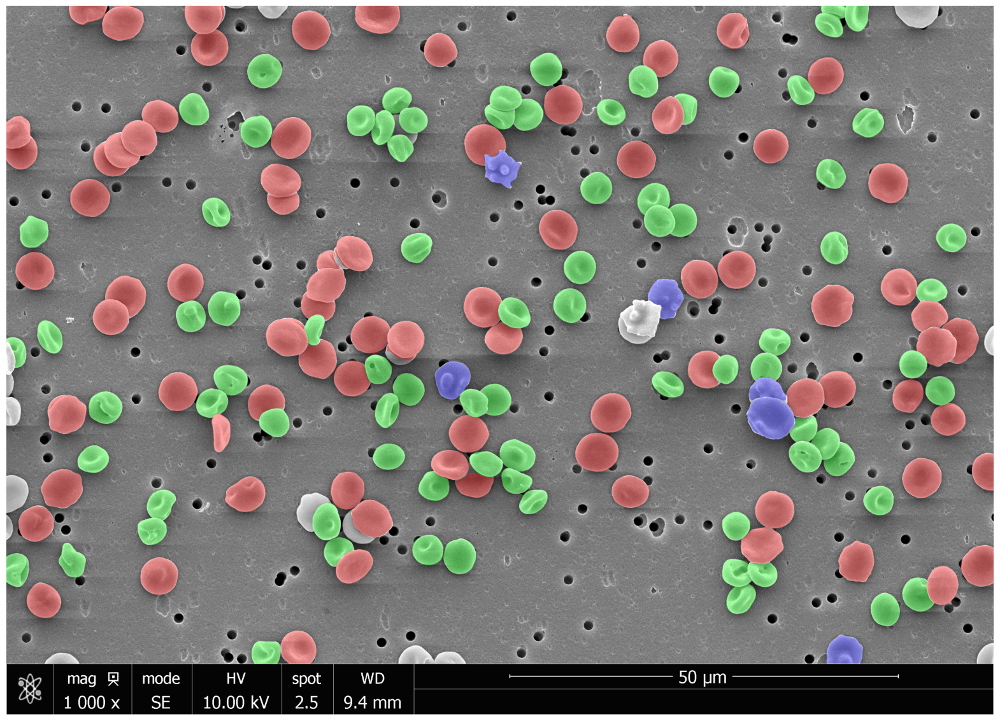

         X        Y  Counter  Count
                                   
1  416.000   76.000        0    152
2  127.500  331.500        0    152
3  366.522  363.632        0    152
4  643.955  548.588        0    152
5  560.147  447.440        0    152
(342, 4)
found 379 masks
{0: 147, 1: 95, 2: 7, 3: 47, 4: 83}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


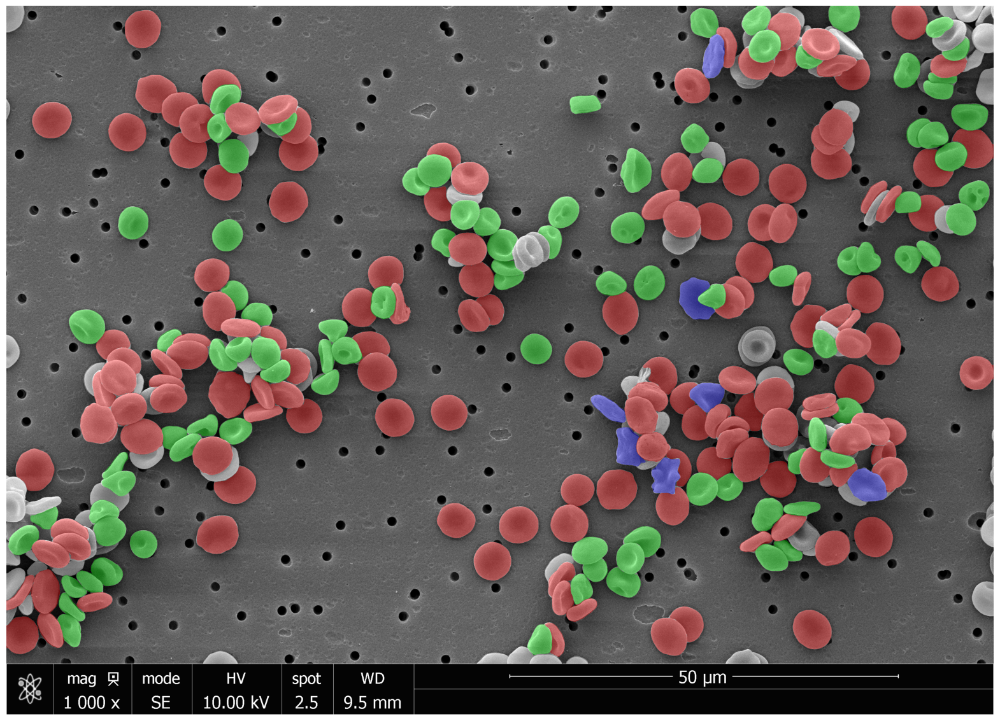

          X        Y  Counter  Count
                                    
1   126.500  166.500        0    229
2    48.629   37.069        0    229
3   930.059  233.585        0    229
4  1074.556  170.006        0    229
5  1141.024  288.493        0    229
(296, 4)
found 373 masks
{0: 225, 1: 7, 2: 6, 3: 37, 4: 98}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


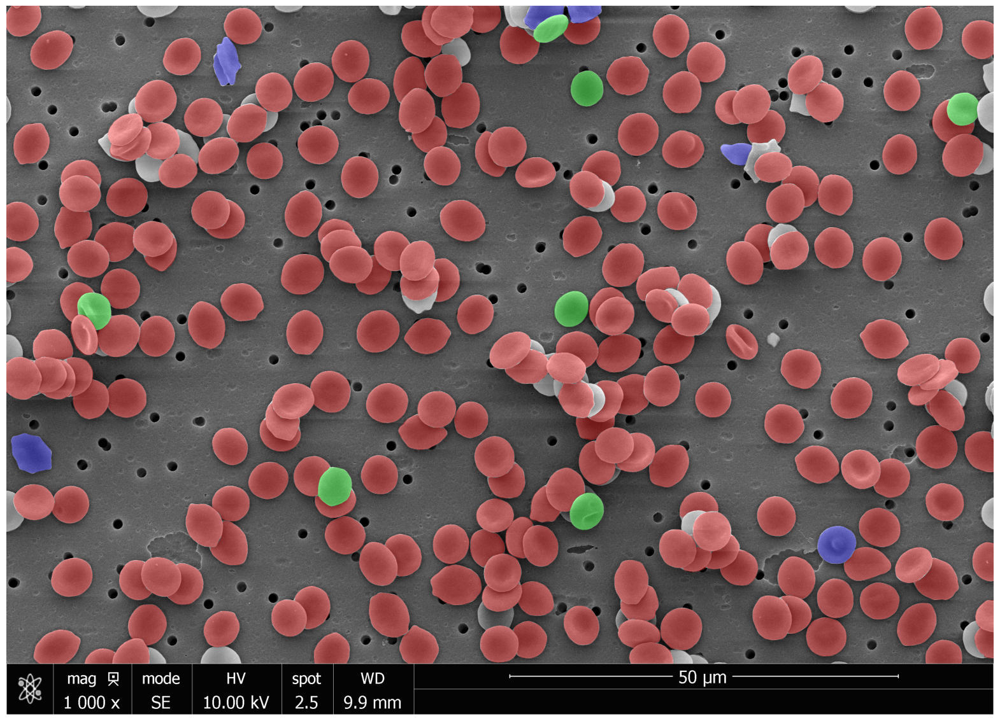

       X      Y  Counter  Count
                               
1  203.0   36.0        0    254
2  213.5  114.5        0    254
3  251.5   97.5        0    254
4  347.5   50.5        0    254
5  394.5  101.5        0    254
(498, 4)
found 629 masks
{0: 245, 1: 212, 2: 22, 3: 2, 4: 148}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


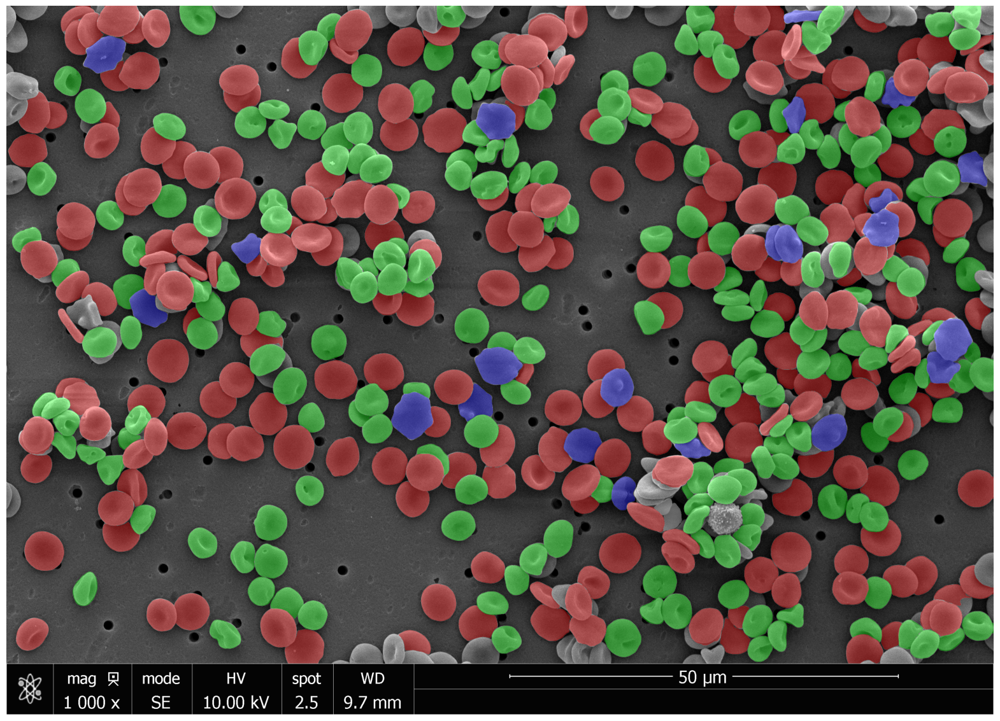

In [8]:
image_filepath = IMAGE_FILEPATHS[0]

all_masks = []
for image_filepath in IMAGE_FILEPATHS:
    labels = read_manual_labels(image_filepath)
    print(labels.head())
    print(labels.shape)

    image = read_image(image_filepath)
    masks = read_masks_for_image(image_filepath)

    label_is_found, mask_is_found, label_is_found_in_multiple_masks = label_masks_v2(masks, labels)

    for mask in masks:
        if 'label' not in mask: continue
        if mask['label'] == 0:
            mask['color'] = [255, 0, 0, 0.35]
        if mask['label'] == 1:
            mask['color'] = [0, 255, 0, 0.35]
        if mask['label'] == 2:
            mask['color'] = [0, 0, 255, 0.35]
        if mask['label'] == 3:
            mask['color'] = [0.9, 0.9, 0.9, 0.35]
        
    masks_image = get_masks_img(masks, image)

    all_masks.append(masks)
            

    plt.figure(figsize=(20,20))
    plt.imshow(image)
    ax = plt.gca()
    ax.set_autoscale_on(False)
    ax.imshow(masks_image)
    plt.axis('off')
    plt.show() 

In [9]:
all_diameters = []
for masks in all_masks:
    diameters = {0: [], 1: [], 2: [], 3: [], 4: []}
    for mask in tqdm(masks):
        if 'label' not in mask: continue
        diameter = find_diameter(mask, coeff=50/1212)
        if diameter > 3:
            mask['diameter'] = diameter
            diameters[mask['label']].append(mask['diameter'])
    
    all_diameters.append(diameters)

100%|██████████| 763/763 [01:11<00:00, 10.68it/s]


label 0
mean 5.365399340083088
std 0.4302060409492332

label 1
mean 4.857324247631967
std 0.24895802283281054

label 2
mean 5.2812323097874705
std 0.9368914343380346

label 0
mean 4.988327542669735
std 0.4194139833703995

label 1
mean 4.17744936696976
std 0.3825695485883387

label 2
mean 5.401003888609746
std 0.4031742343386648

label 0
mean 5.037906147483413
std 0.40823878207581515

label 1
mean 4.183008458949591
std 0.2707433452839206

label 2
mean 5.239255466380211
std 0.49494016294287835

label 0
mean 4.818919388036219
std 0.6029889353168482

label 1
mean 4.17041096854307
std 0.3565104130207755

label 2
mean 5.020805892041118
std 0.6324270609412003



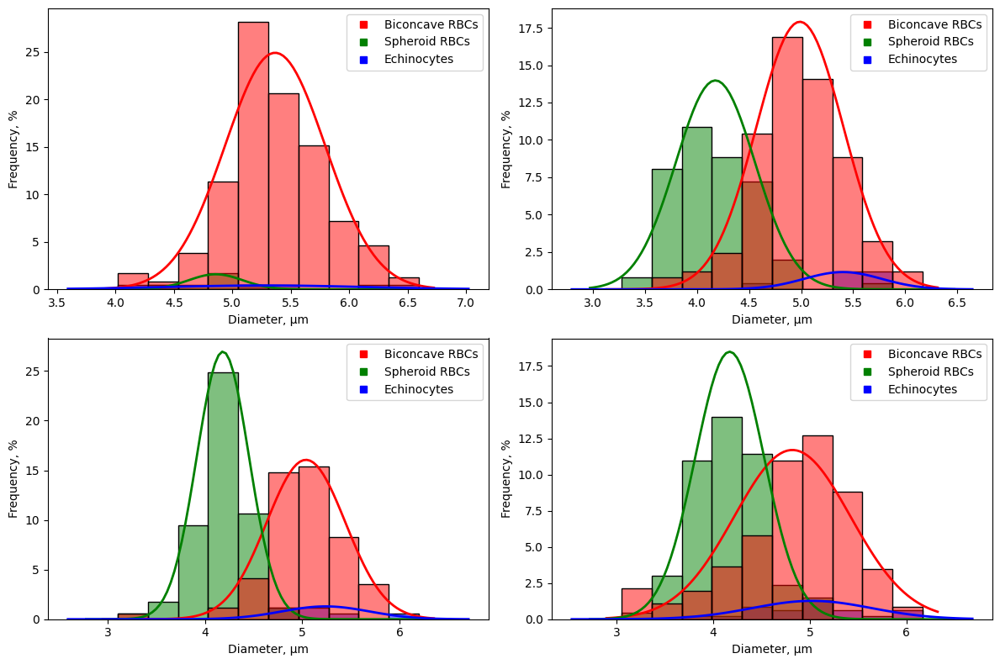

In [76]:
rows = [0, 0, 1, 1]
columns = [0, 1, 0, 1]

labels_mapping = {
    0: 'Biconcave RBCs',
    1: 'Spheroid RBCs',
    2: 'Echinocytes'
}

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

for ax_index, index in enumerate([2, 1, 0, 3]):
    ax = axes[rows[ax_index], columns[ax_index]]

    diameters = all_diameters[index]
    _labels = []
    _diameters = []
    for k in [0, 1, 2]: 
        for d in diameters[k]:
            _labels.append(k)
            _diameters.append(d)

    df = pd.DataFrame({"label":_labels, "diameter":_diameters})
    df['mapped_label'] = df['label'].map(labels_mapping)

    # Calculate the percentage for each class
    class_counts = df['label'].value_counts()
    percent_per_class = class_counts / len(df)
 

    bins_number = 10
    colors = ['red', 'green', 'blue']
    sns.histplot(data=df, ax=ax, x="diameter", hue="mapped_label", bins=bins_number, kde=False, stat='percent', palette=colors)

    for k, color in zip([0, 1, 2], colors):
        # Plot the PDF.
        mu, std = norm.fit(df[df['label'] == k]['diameter'])

        xmin, xmax = ax.get_xlim()
        bin_width = (xmax - xmin) / bins_number
        x = np.linspace(xmin, xmax, 100)
        p = percent_per_class[k] * 100 * norm.pdf(x, mu, std) * bin_width
        ax.plot(x, p, linewidth=2, color=color)

    for k in [0, 1, 2]:
        print('label', k)
        print('mean', df.loc[df['label'] == k, 'diameter'].mean())
        print('std', df.loc[df['label'] == k, 'diameter'].std())
        print()

    ax.set_ylabel("Frequency, %")
    ax.set_xlabel('Diameter, \u03BCm')
    
    # If you still want to show a custom legend for both subplots, you can create it manually like this:
    custom_legend = [plt.Line2D([], [], color=colors[i], marker='s', linestyle='', label=labels_mapping[i]) for i in sorted(labels_mapping.keys())]
    ax.legend(handles=custom_legend, title="", loc="upper right")

# Adjust layout
plt.tight_layout()
output_file = 'all_gaussian.tif'.format(index)
plt.savefig(output_file, dpi=600, format='tif')
plt.show()



In [ ]:
for diameters in all_diameters:
    plt.subplots(figsize=(7,6), dpi=600)
    sns.histplot(diameters[0], color="red", label="0")
    sns.histplot(diameters[1], color="green", label="1")
    sns.histplot(diameters[2], color="blue", label="2")

    plt.legend()

In [12]:
for image_index, diameters in enumerate(all_diameters):
    data = {'label': [], 'diameter': []}
    for k in [0, 1, 2]:
        for i in range(len(diameters[k])):
            data['label'].append(k)
            data['diameter'].append(diameters[k][i])           
    
    df = pd.DataFrame(data)
    df.to_csv(os.path.normpath('C://Users/lapin/Documents/for_alina/rbc/diameters_{}.csv'.format(image_index)), index=False)

0
6.162350086977639
[2199, 0, 114, 134]


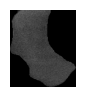

0
5.705163649314905
[1473, 1303, 109, 133]


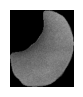

0
5.900493782703078
[1656, 1310, 103, 141]


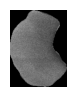

0
5.872159221143544
[1010, 540, 129, 120]


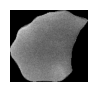

2
6.094590223883728
[240, 93, 130, 116]


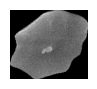

0
5.705163649314905
[1549, 90, 137, 105]


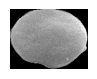

0
5.7218445789956744
[1538, 185, 121, 126]


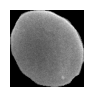

2
6.165801340139184
[1458, 1062, 147, 117]


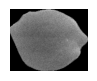

0
5.705909373603995
[831, 1305, 127, 137]


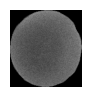

2
6.114523865890728
[1198, 1202, 129, 148]


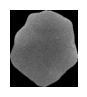

0
5.707549624075207
[438, 1038, 129, 135]


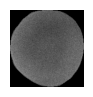

0
6.013770518611077
[1294, 318, 137, 140]


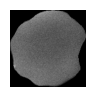

In [13]:
for mask in masks:
    if 'label' not in mask: continue
    if mask['label'] not in [0, 1, 2]: continue
    if 'diameter' not in mask: continue
    if mask['diameter'] > 5.7:
        print(mask['label'])
        print(mask['diameter'])
        coords = mask['bbox']
        print(coords)
        segmentation = mask['segmentation']
        roi = image[coords[1]:coords[1]+coords[3]+1, coords[0]:coords[0]+coords[2]+1]
        masked_roi = roi * segmentation[:, :, np.newaxis]

        plt.figure(figsize=(1,1))
        plt.imshow(masked_roi)
        plt.axis('off')
        plt.show()

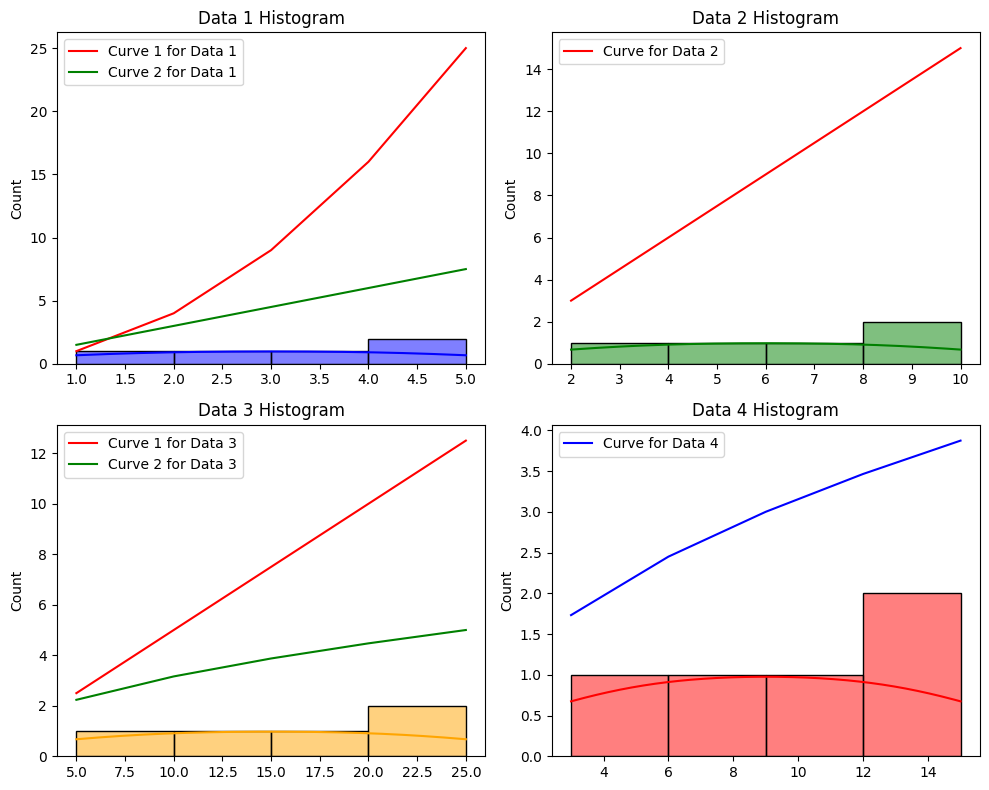

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sample data (replace with your actual data)
data_1 = [1, 2, 3, 4, 5]
data_2 = [2, 4, 6, 8, 10]
data_3 = [5, 10, 15, 20, 25]
data_4 = [3, 6, 9, 12, 15]

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Plot data_1 histogram on the top-left subplot
sns.histplot(data_1, ax=axs[0, 0], kde=True, color='blue')
axs[0, 0].set_title('Data 1 Histogram')

# Add curves corresponding to data_1 over the histogram
x_data_1 = [1, 2, 3, 4, 5]
y_data_1_curve_1 = [y_val ** 2 for y_val in x_data_1]  # You can replace this with your curve data
y_data_1_curve_2 = [y_val * 1.5 for y_val in x_data_1]  # Another curve
axs[0, 0].plot(x_data_1, y_data_1_curve_1, color='red', label='Curve 1 for Data 1')
axs[0, 0].plot(x_data_1, y_data_1_curve_2, color='green', label='Curve 2 for Data 1')
axs[0, 0].legend()

# Plot data_2 histogram on the top-right subplot
sns.histplot(data_2, ax=axs[0, 1], kde=True, color='green')
axs[0, 1].set_title('Data 2 Histogram')

# Add a curve corresponding to data_2 over the histogram
x_data_2 = [2, 4, 6, 8, 10]
y_data_2_curve = [y_val * 1.5 for y_val in x_data_2]  # You can replace this with your curve data
axs[0, 1].plot(x_data_2, y_data_2_curve, color='red', label='Curve for Data 2')
axs[0, 1].legend()

# Plot data_3 histogram on the bottom-left subplot
sns.histplot(data_3, ax=axs[1, 0], kde=True, color='orange')
axs[1, 0].set_title('Data 3 Histogram')

# Add curves corresponding to data_3 over the histogram
x_data_3 = [5, 10, 15, 20, 25]
y_data_3_curve_1 = [y_val * 0.5 for y_val in x_data_3]  # You can replace this with your curve data
y_data_3_curve_2 = [y_val ** 0.5 for y_val in x_data_3]  # Another curve
axs[1, 0].plot(x_data_3, y_data_3_curve_1, color='red', label='Curve 1 for Data 3')
axs[1, 0].plot(x_data_3, y_data_3_curve_2, color='green', label='Curve 2 for Data 3')
axs[1, 0].legend()

# Plot data_4 histogram on the bottom-right subplot
sns.histplot(data_4, ax=axs[1, 1], kde=True, color='red')
axs[1, 1].set_title('Data 4 Histogram')

# Add a curve corresponding to data_4 over the histogram
x_data_4 = [3, 6, 9, 12, 15]
y_data_4_curve = [y_val ** 0.5 for y_val in x_data_4]  # You can replace this with your curve data
axs[1, 1].plot(x_data_4, y_data_4_curve, color='blue', label='Curve for Data 4')
axs[1, 1].legend()

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()